In [1]:
import importlib
import utils
importlib.reload(utils)
from utils import *
import files
importlib.reload(files)
from files import *

In [2]:
for city, path in files.items():
      globals()[f"consommation_heat_{city}"] = extract_columns(files[city])

for city2, path2 in files.items():
      globals()[f"consommation_cool_{city2}"] = extract_columns(files[city2],5)    

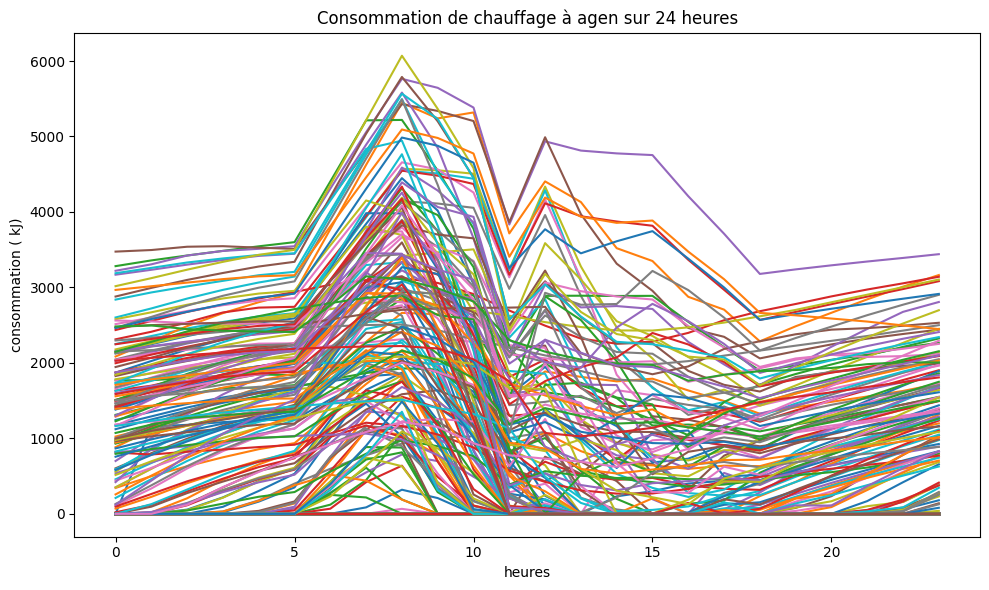

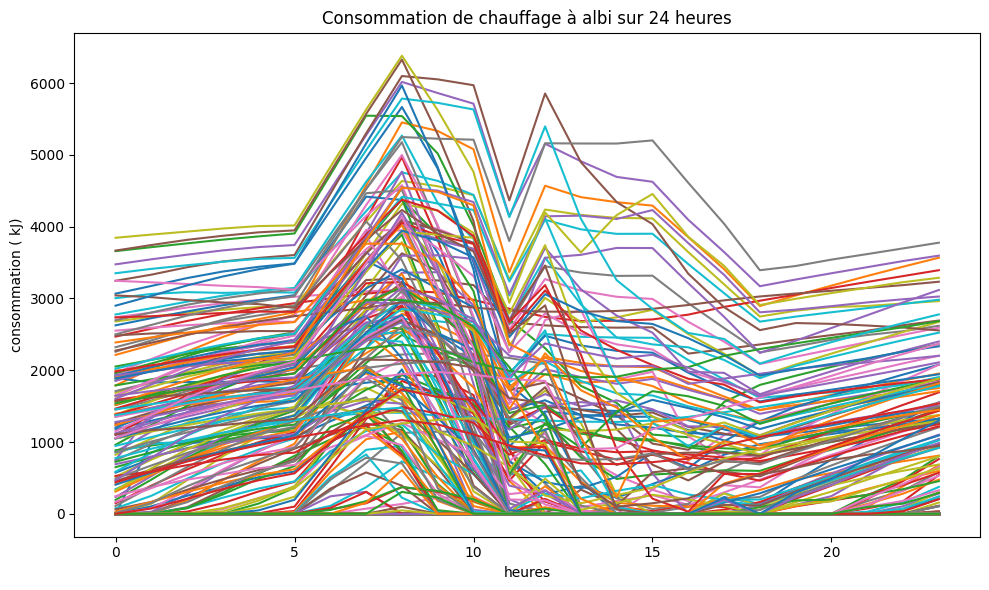

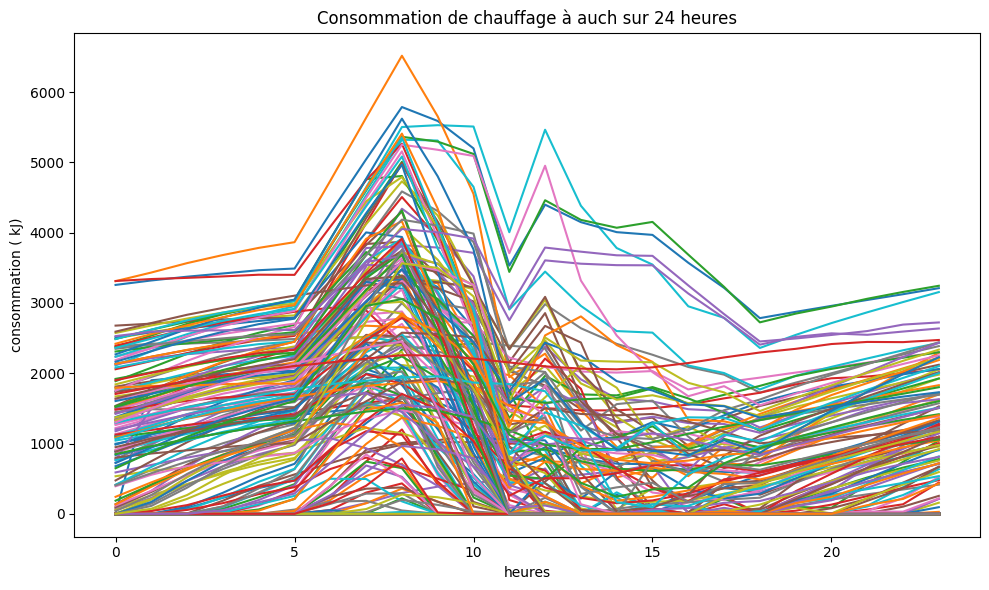

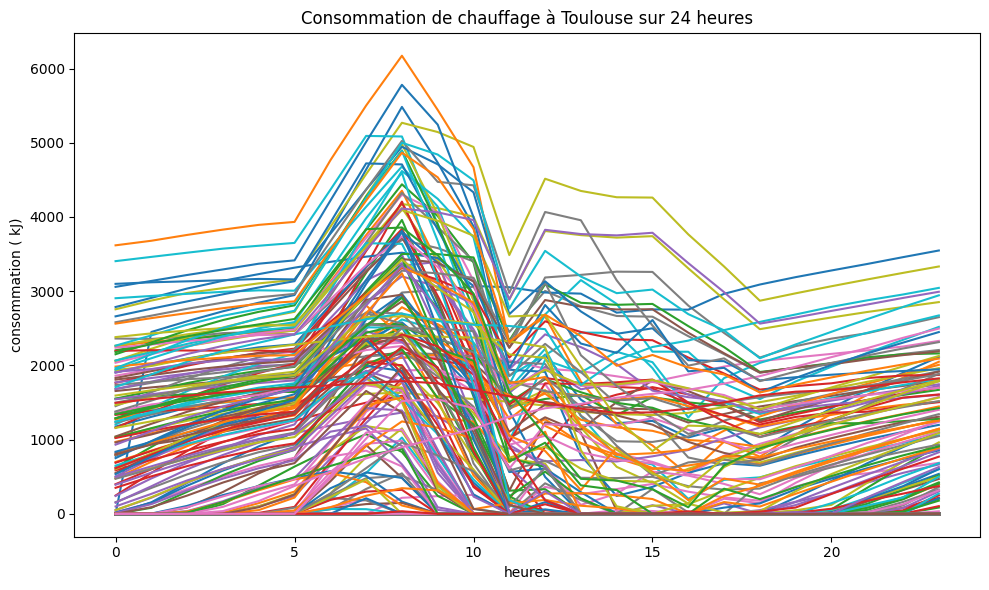

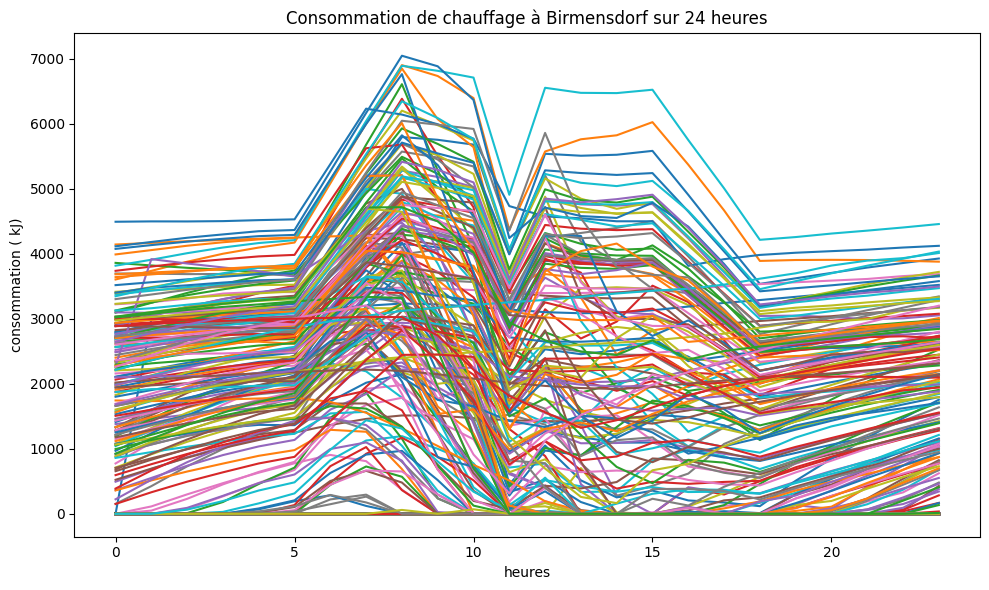

...

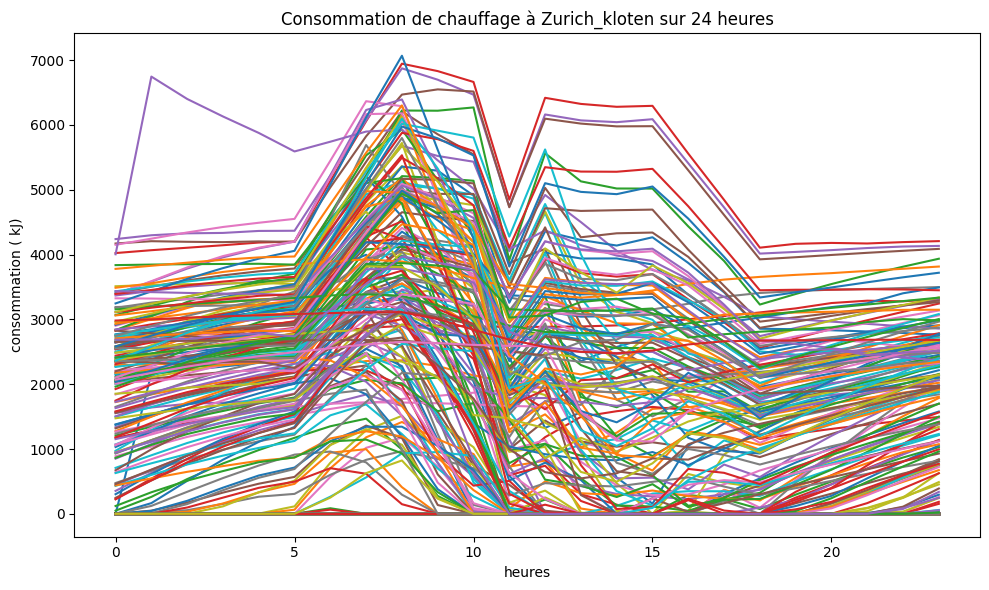

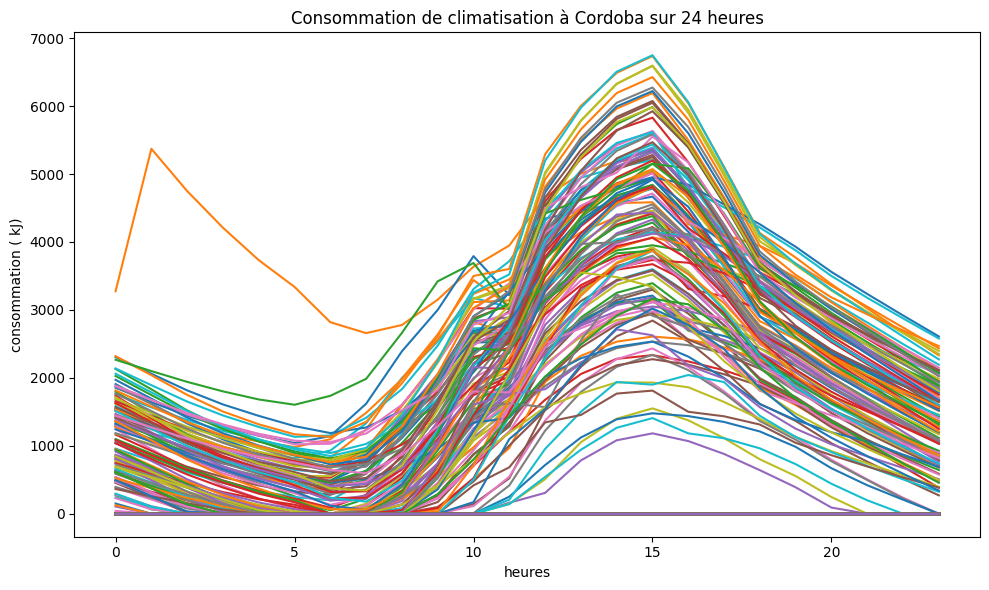

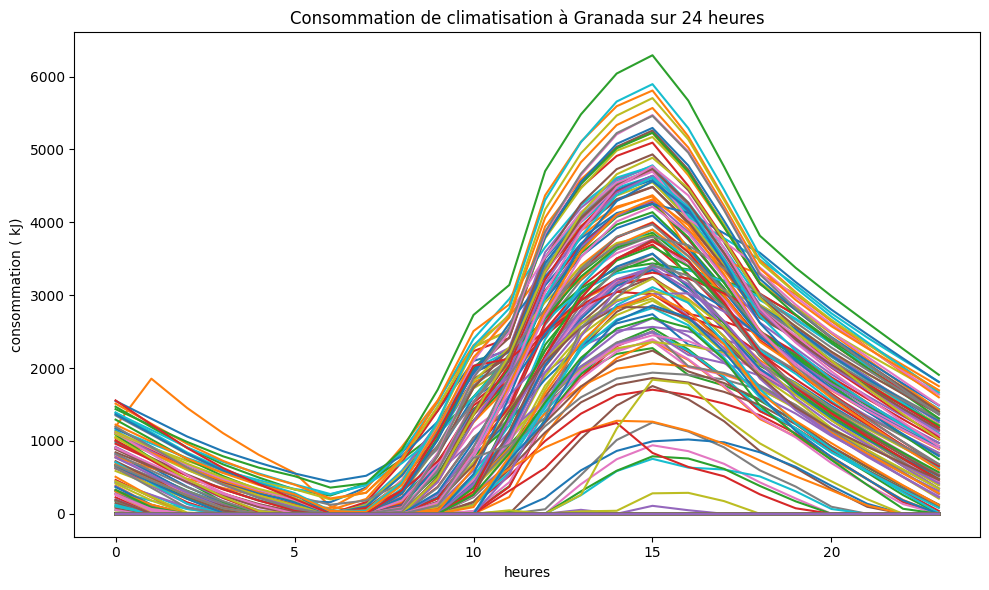

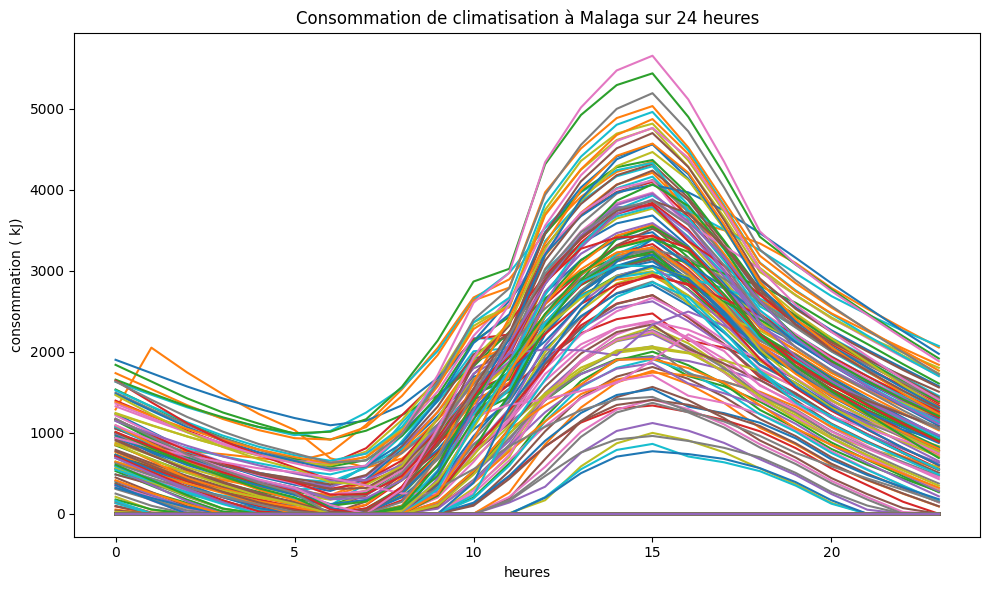

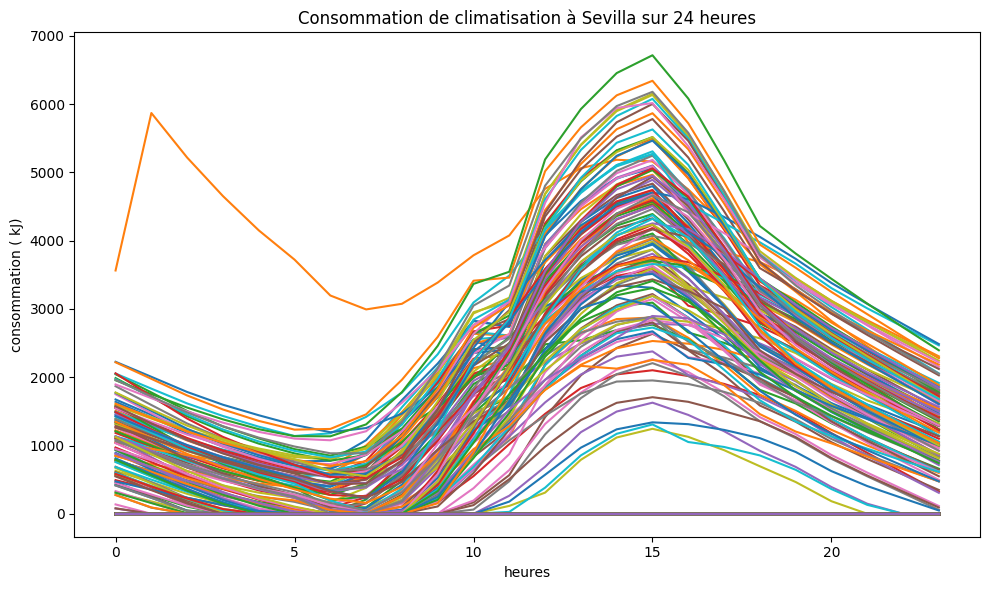

In [5]:
draw(consommation_heat_agen, "Consommation de chauffage à agen sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_albi, "Consommation de chauffage à albi sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_auch, "Consommation de chauffage à auch sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_toulouse, "Consommation de chauffage à Toulouse sur 24 heures","heures","consommation ( kJ)")

draw(consommation_heat_Birmensdorf, "Consommation de chauffage à Birmensdorf sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_Taenikon, "Consommation de chauffage à Taenikon sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_Zurich_fluntern, "Consommation de chauffage à Zurich_fluntern sur 24 heures","heures","consommation ( kJ)")
draw(consommation_heat_Zurich_kloten, "Consommation de chauffage à Zurich_kloten sur 24 heures","heures","consommation ( kJ)")

draw(consommation_cool_Cordoba, "Consommation de climatisation à Cordoba sur 24 heures","heures","consommation ( kJ)")
draw(consommation_cool_Granada, "Consommation de climatisation à Granada sur 24 heures","heures","consommation ( kJ)")
draw(consommation_cool_Malaga, "Consommation de climatisation à Malaga sur 24 heures","heures","consommation ( kJ)")
draw(consommation_cool_Sevilla, "Consommation de climatisation à Sevilla sur 24 heures","heures","consommation ( kJ)")

In [36]:
df_combined_tou = pd.concat([consommation_heat_agen, consommation_heat_albi,consommation_heat_auch,consommation_heat_toulouse], axis=0).reset_index(drop=True)
df_combined_zur = pd.concat([consommation_heat_Birmensdorf, consommation_heat_Taenikon,consommation_heat_Zurich_fluntern,consommation_heat_Zurich_kloten], axis=0).reset_index(drop=True)
df_combined_sev = pd.concat([consommation_cool_Cordoba, consommation_cool_Granada,consommation_cool_Malaga,consommation_cool_Sevilla], axis=0).reset_index(drop=True)

df_final_tou=add_binary_column(df_combined_tou, column_name="heat_on")
df_final_zur=add_binary_column(df_combined_zur, column_name="heat_on")
df_final_sev=add_binary_column(df_combined_sev, column_name="cool_on")



In [37]:
df_heat = df_final_tou[df_final_tou["heat_on"] == 1].drop(columns=["heat_on"])
model = apply_kmeans(n_clusters=3, data=df_heat)
df_final_tou.loc[df_final_tou["heat_on"] == 1, "clusters"] = model.labels_
df_final_tou.loc[df_final_tou["heat_on"] == 0, "clusters"] = 3
cluster_centers = model.cluster_centers_
zero_center = np.zeros(cluster_centers.shape[1])  
cluster_centers = np.vstack([cluster_centers, zero_center])
centers_df_conso = pd.DataFrame(cluster_centers, columns=df_heat.columns)


df_heat = df_final_zur[df_final_zur["heat_on"] == 1].drop(columns=["heat_on"])
model = apply_kmeans(n_clusters=3, data=df_heat)
df_final_zur.loc[df_final_zur["heat_on"] == 1, "clusters"] = model.labels_
df_final_zur.loc[df_final_zur["heat_on"] == 0, "clusters"] = 3

df_cool = df_final_sev[df_final_sev["cool_on"] == 1].drop(columns=["cool_on"])
model = apply_kmeans(n_clusters=3, data=df_cool)
df_final_sev.loc[df_final_sev["cool_on"] == 1, "clusters"] = model.labels_
df_final_sev.loc[df_final_sev["cool_on"] == 0, "clusters"] = 3

**********************3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à Toulouse et ses périphéries ***************************


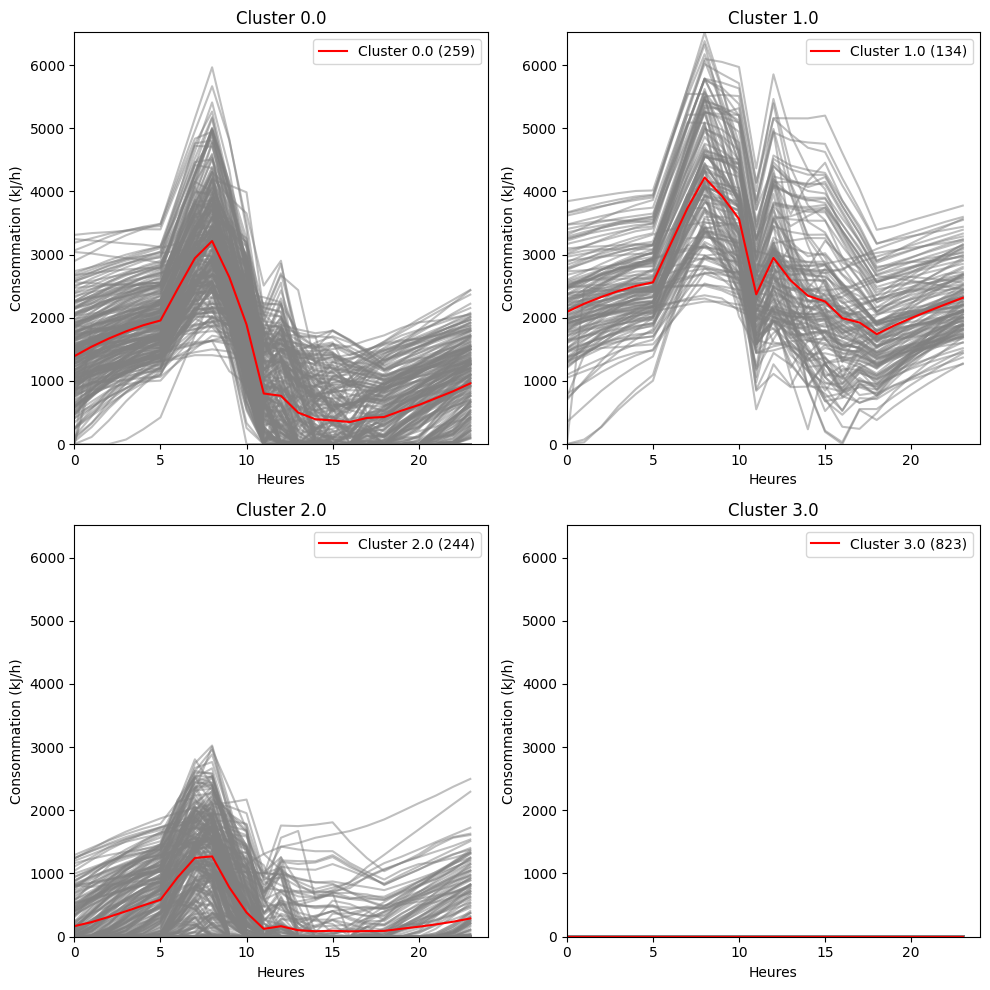

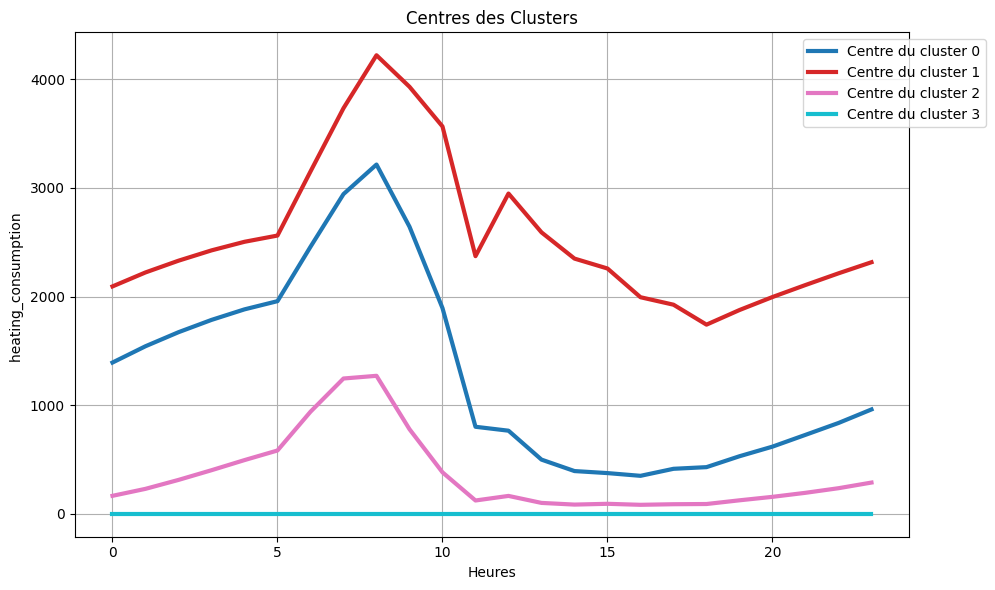

In [38]:
print("**********************3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à Toulouse et ses périphéries ***************************")
plot_clusters(df_final_tou.drop(columns=["heat_on"]))
plot_cluster_centers_with_colors(df_final_tou.drop(columns=["heat_on"]), df_final_tou["clusters"], y_label="heating_consumption ")

In [39]:
evaluate_clustering_cooling(df_final_tou,"heat_on")

Davies-Bouldin Index: 0.9218321164573672
Silhouette Score: 0.6270163106098231


In [40]:
df_final_tou.to_csv("conso_heat_perif_toulouse",index=False)

In [9]:
centers_df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,2093.070601,2221.799833,2329.779134,2424.742706,2503.857417,2561.267116,3151.169579,3733.652940,4220.875192,3930.811305,...,2349.111125,2257.895107,1993.491003,1924.752514,1741.168049,1875.744642,1995.413245,2106.028849,2213.467809,2315.804676
1,170.404673,235.383010,318.049167,407.527673,500.789711,589.236387,947.614001,1255.205279,1280.889729,787.468310,...,84.056977,91.234048,82.024175,87.388561,89.341083,123.146138,154.814622,191.595398,233.599563,285.222671
2,1397.003053,1547.130668,1676.306020,1789.382107,1886.423979,1961.805507,2461.924851,2946.730641,3219.762819,2648.847853,...,396.383964,377.545801,352.208952,417.405008,432.774352,533.889304,623.073147,732.394384,842.424162,968.200220
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [42]:
cluster_centers = centers_df_conso.values
metrics = []

for cluster_id in range(4):  
    cluster_data2 = df_final_tou[df_final_tou["clusters"] == cluster_id].drop(columns=["heat_on", "clusters"])
    cluster_center2 = cluster_centers[cluster_id]
    mse_total, mae_total, rmse_total = 0, 0, 0

    for i, row in cluster_data2.iterrows():
        mse, mae, rmse = calculate_metrics(row.values, cluster_center2)
        mse_total += mse
        mae_total += mae
        rmse_total += rmse
    

    num_series = len(cluster_data2)
    mse_total /= num_series
    mae_total /= num_series
    rmse_total /= num_series

    metrics.append({
        "cluster_id": cluster_id,
        "mse": mse_total,
        "mae": mae_total,
        "rmse": rmse_total
    })

metrics_df = pd.DataFrame(metrics)
avg_metrics = metrics_df[['mse', 'mae', 'rmse']].mean()
print(metrics_df)
print("\nMoyennes des métriques")
print(avg_metrics)

   cluster_id            mse         mae        rmse
0           0  385648.833929  512.374792  593.594374
1           1  603460.959700  611.848911  720.571287
2           2  197599.375283  322.481430  413.331122
3           3       0.000000    0.000000    0.000000

Moyennes des métriques
mse     296677.292228
mae        361.676283
rmse       431.874196
dtype: float64


**********************3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à zurich et ses périphéries ***************************


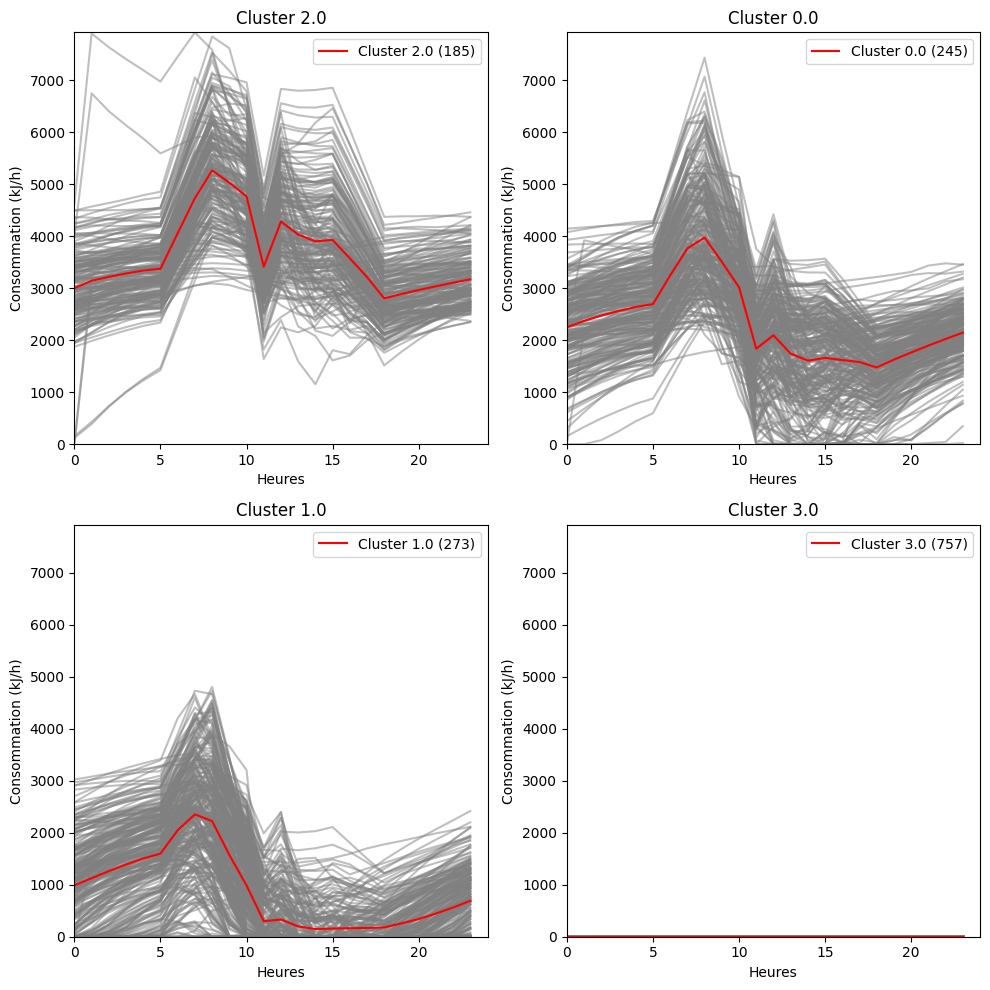

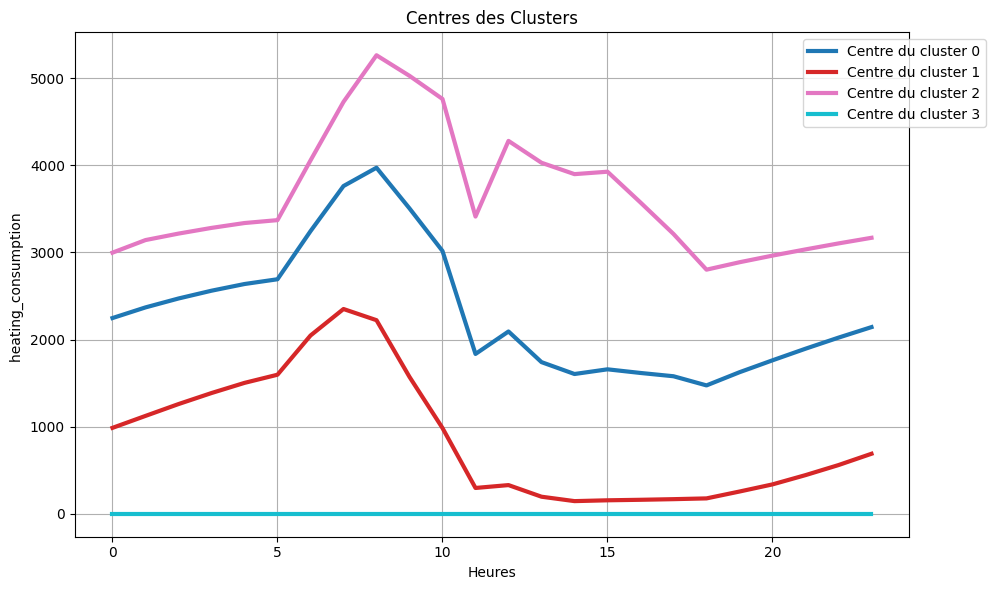

In [14]:
print("**********************3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à zurich et ses périphéries ***************************")
plot_clusters(df_final_zur.drop(columns=["heat_on"]))
plot_cluster_centers_with_colors(df_final_zur.drop(columns=["heat_on"]), df_final_zur["clusters"], y_label="heating_consumption ")

In [15]:
evaluate_clustering_cooling(df_final_zur,"heat_on")

Davies-Bouldin Index: 0.858713936516137
Silhouette Score: 0.6351787445975388


In [16]:
df_final_zur.to_csv("conso_heat_perif_zurich",index=False)

**********************3 clusters pour les jours où la climatisation  est allumé et 1 cluster pour les jours d'hiver à seville et ses périphéries ***************************


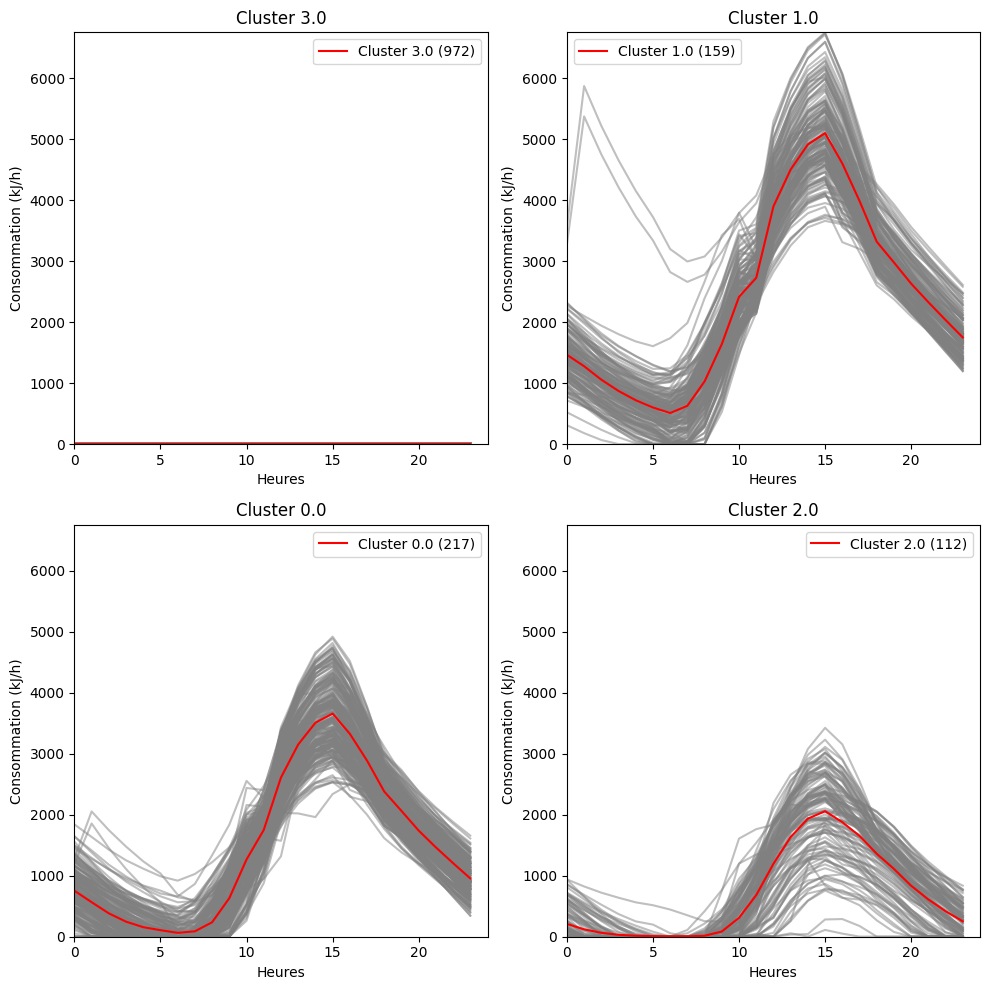

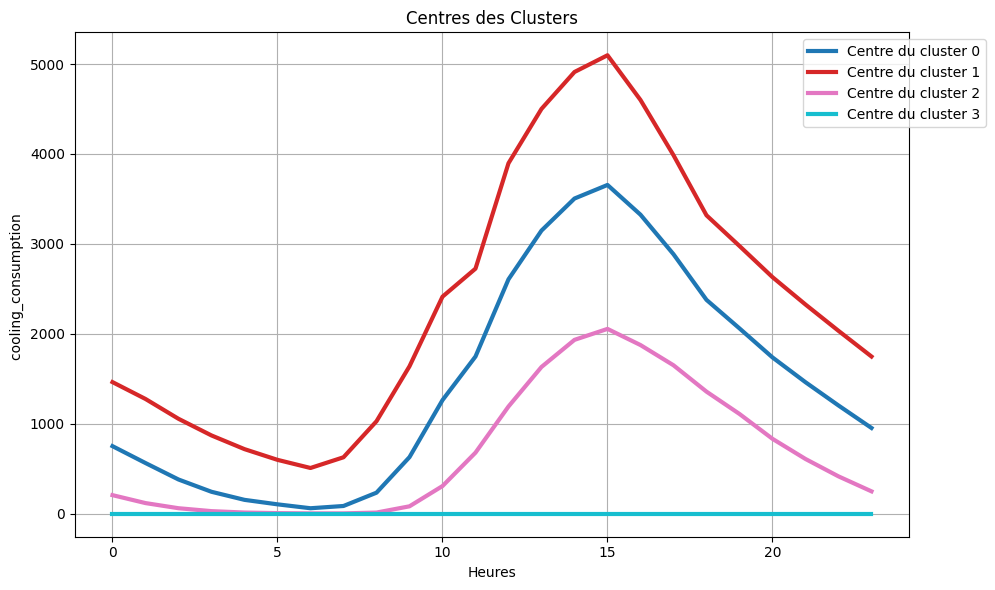

In [17]:
print("**********************3 clusters pour les jours où la climatisation  est allumé et 1 cluster pour les jours d'hiver à seville et ses périphéries ***************************")
plot_clusters(df_final_sev.drop(columns=["cool_on"]))
plot_cluster_centers_with_colors(df_final_sev.drop(columns=["cool_on"]), df_final_sev["clusters"], y_label="cooling_consumption ")

In [18]:
evaluate_clustering_cooling(df_final_sev,"cool_on")

Davies-Bouldin Index: 0.6545538204407262
Silhouette Score: 0.7911944594618303


In [19]:
df_final_sev.to_csv("conso_cool_perif_seville",index=False)

In [20]:
df_combined_tou=df_combined_tou.drop(columns=["clusters"])

In [21]:


cols_1 = list(range(0, 6)) + [-1]
cols_2 = list(range(6, 12)) + [-1]  
cols_3 = list(range(12, 17)) + [-1] 
cols_4 = list(range(17, 24)) + [-1]
cols_list = [cols_1, cols_2, cols_3, cols_4]
n_clusters_list = [3, 4, 4, 3]

clustered_dfs = cluster_data(df_combined_tou, 'heat_on', n_clusters_list, cols_list)     
df_part1 = clustered_dfs['df_part1']
df_part2 = clustered_dfs['df_part2'] 
df_part3 = clustered_dfs['df_part3']
df_part4 = clustered_dfs['df_part4']
    

C:\Users\toubia\stage\Untitled Folder\utils.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_part.loc[df_part[heat_on_column] == 1, 'clusters'] = model.labels_
C:\Users\toubia\stage\Untitled Folder\utils.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_part.loc[df_part[heat_on_column] == 1, 'clusters'] = model.labels_
C:\Users\toubia\stage\Untitled Folder\utils.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

********************** 3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à toulouse et ses périphéries (de 0 a 5h ***************************


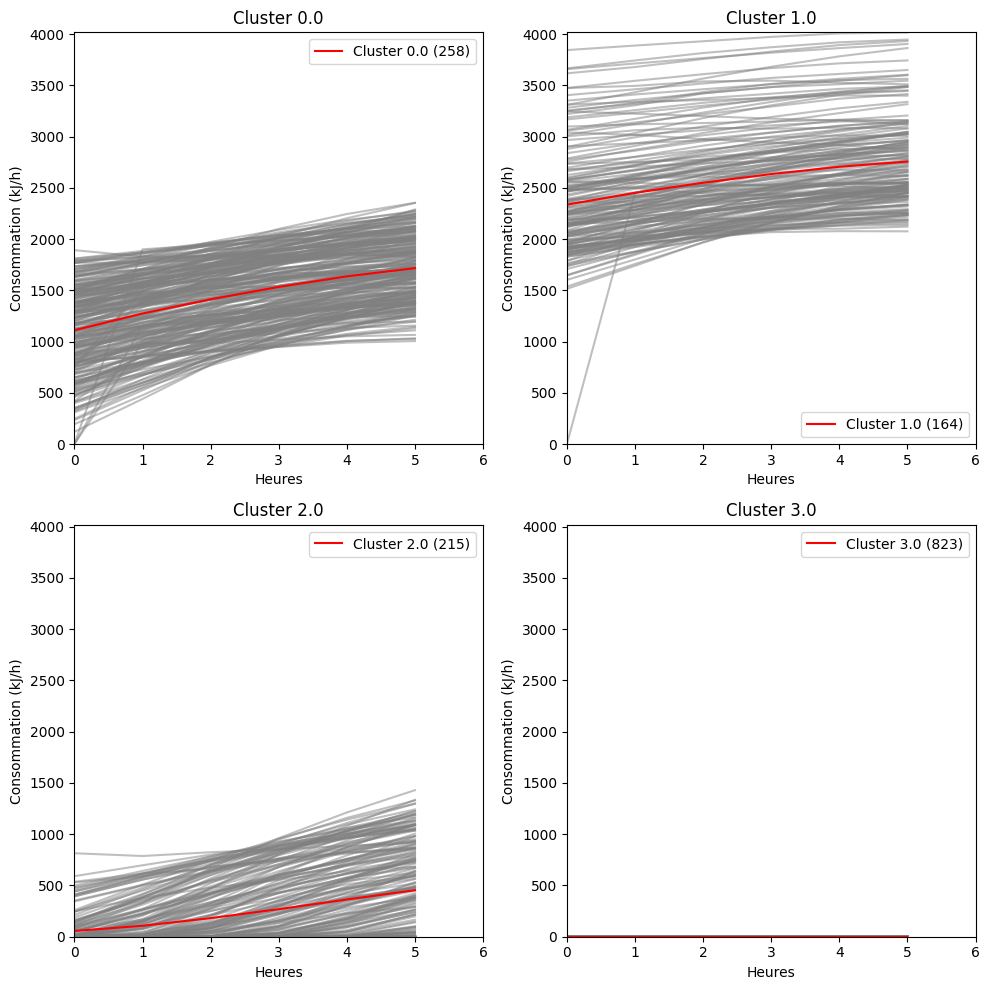

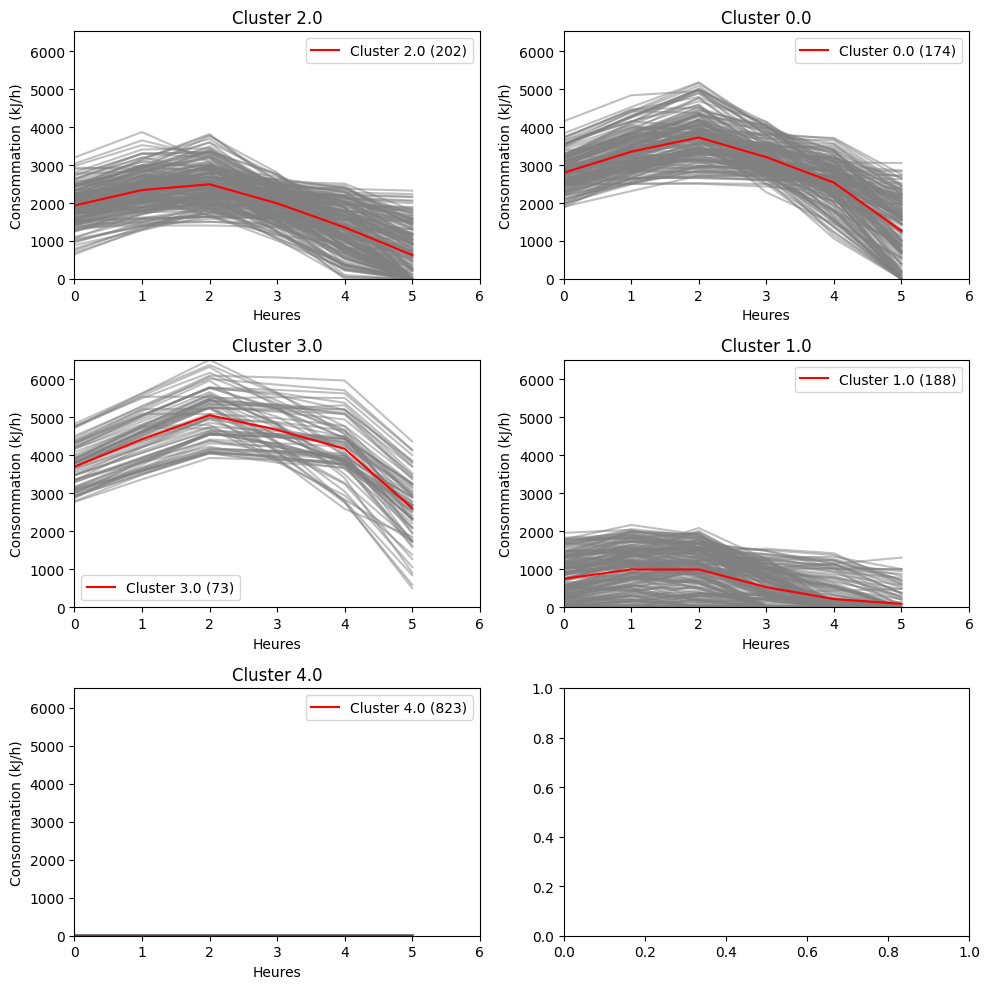

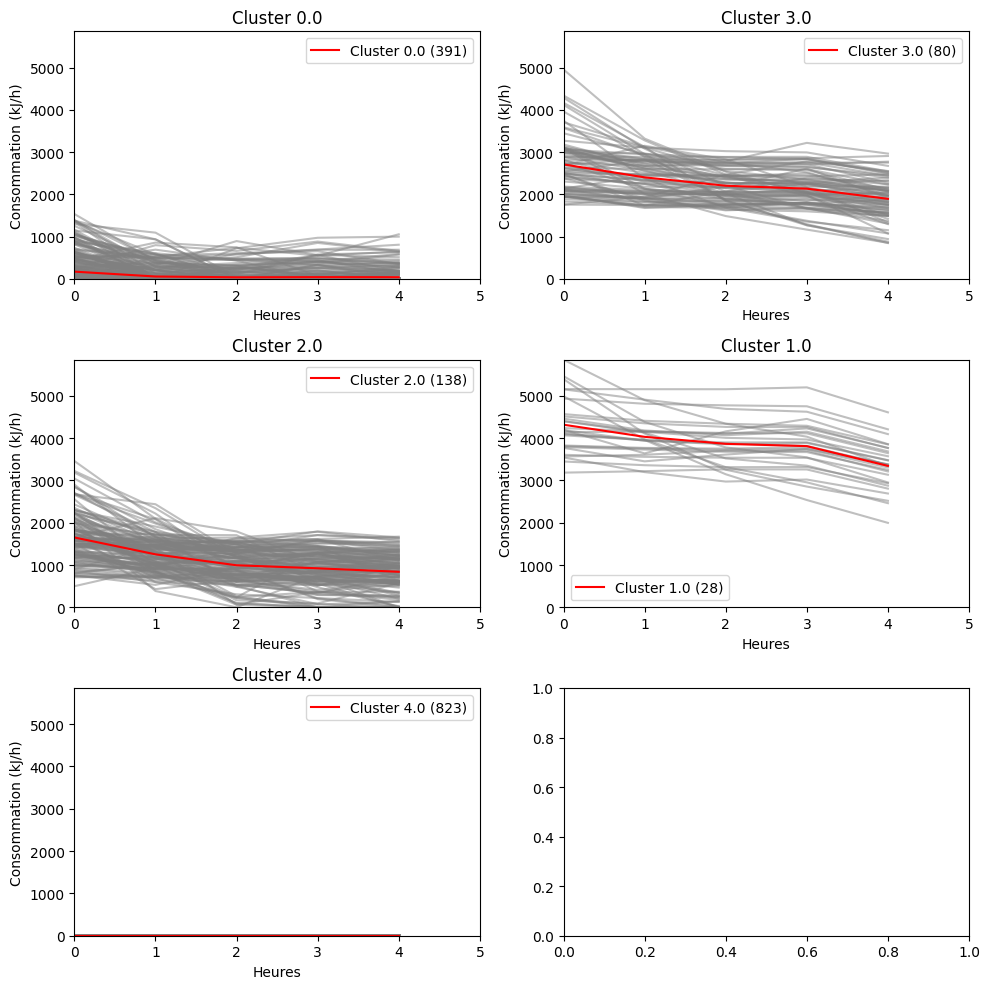

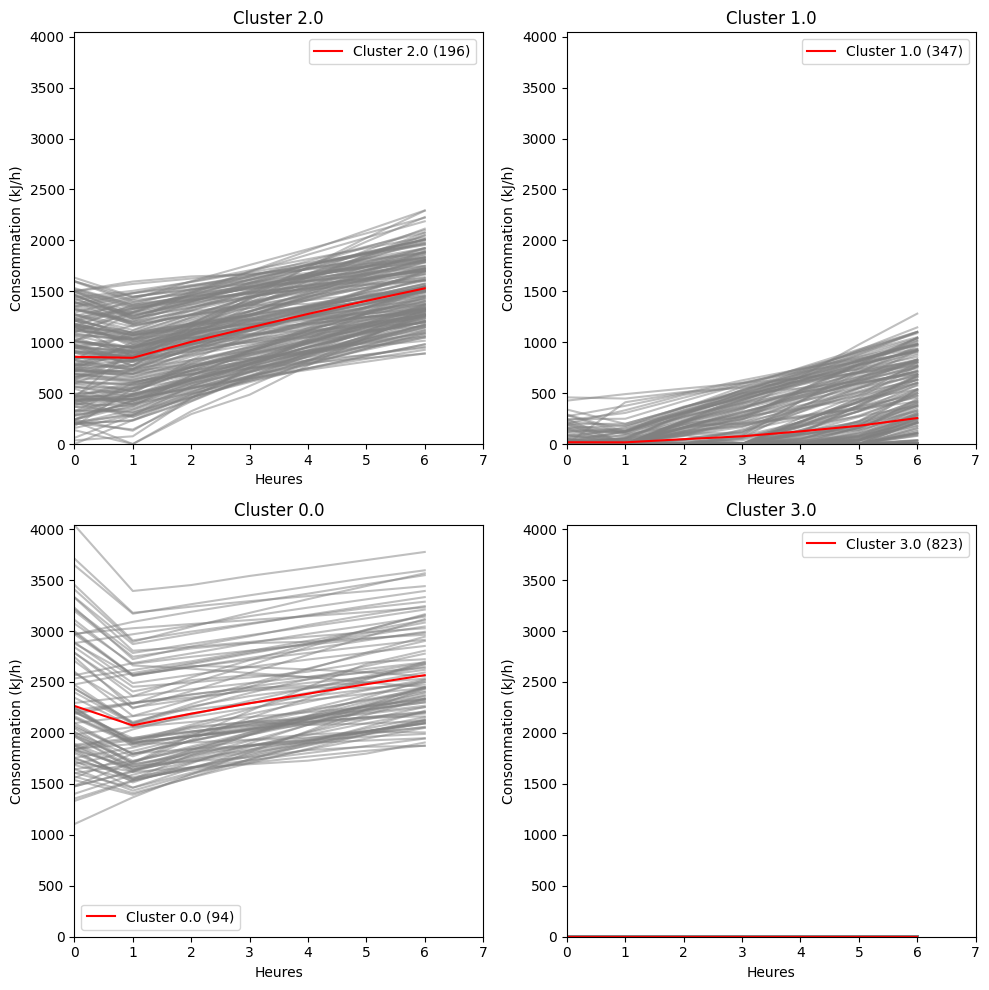

In [22]:
print("********************** 3 clusters pour les jours où le chauffage est allumé et 1 cluster pour les jours d'été à toulouse et ses périphéries (de 0 a 5h ***************************")

plot_clusters(df_part1.drop(columns=["heat_on"]))
plot_clusters(df_part2.drop(columns=["heat_on"]))
plot_clusters(df_part3.drop(columns=["heat_on"]))
plot_clusters(df_part4.drop(columns=["heat_on"]))

In [23]:

dfs_parts = {"df_part1": df_part1, "df_part2": df_part2, "df_part3": df_part3, "df_part4": df_part4}
centers_per_part = {part: compute_cluster_centers(df) for part, df in dfs_parts.items()}



In [45]:
def compute_metrics_per_part(df_part):  
    centers_df = compute_cluster_centers(df_part) 
    cluster_centers = centers_df.values 
    metrics = []
    total_samples = len(df_part)

    for cluster_id in df_part["clusters"].unique():
        cluster_data = df_part[df_part["clusters"] == cluster_id].drop(columns=["heat_on", "clusters"])
        cluster_center = centers_df.loc[cluster_id].values
        mse_total, mae_total, rmse_total = 0, 0, 0

        for _, row in cluster_data.iterrows():
            mse, mae, rmse = calculate_metrics(row.values, cluster_center)
            mse_total += mse
            mae_total += mae
            rmse_total += rmse

        num_series = len(cluster_data)

        metrics.append({
            "cluster_id": cluster_id,
            "num_series": num_series,
            "mse": mse_total / num_series,
            "mae": mae_total / num_series,
            "rmse": rmse_total / num_series
        })

    metrics_df = pd.DataFrame(metrics)

    global_metrics = {
        "mse_global": (metrics_df["mse"] * metrics_df["num_series"]).sum() / total_samples,
        "mae_global": (metrics_df["mae"] * metrics_df["num_series"]).sum() / total_samples,
        "rmse_global": (metrics_df["rmse"] * metrics_df["num_series"]).sum() / total_samples
    }

    return metrics_df,global_metrics

metrics_results = {part: compute_metrics_per_part(df) for part, df in dfs_parts.items()}

metrics_df = pd.DataFrame.from_dict(metrics_results, orient="index").reset_index()
metrics_df.rename(columns={"index": "Partie"}, inplace=True)
avg_metrics = metrics_df[['mse_global', 'mae_global', 'rmse_global']].mean()
print(metrics_df)
print("\nMoyennes des métriques")
print(avg_metrics)


    cluster_id  num_series            mse         mae        rmse
0          0.0         258  118048.259928  291.829786  306.382228
1          1.0         164  212724.069646  366.543119  378.020604
2          2.0         215   95390.313770  246.541854  277.810656
3          3.0         823       0.000000    0.000000    0.000000
4          2.0         202  278050.732378  426.579825  501.120414
5          0.0         174  342535.103980  469.354325  551.526411
6          3.0          73  456425.439417  554.234283  629.070399
7          1.0         188  243941.660040  396.656113  465.861381
8          4.0         823       0.000000    0.000000    0.000000
9          0.0         391   38763.588397  112.182213  143.713632
10         3.0          80  245725.574255  400.061090  451.267286
11         2.0         138  210411.362777  368.873949  422.956619
12         1.0          28  317987.917879  439.728083  487.809923
13         4.0         823       0.000000    0.000000    0.000000
14        

In [46]:
def compute_metrics_per_part(df_part):  
    centers_df = compute_cluster_centers(df_part) 
    cluster_centers = centers_df.values 
    metrics = []
    total_samples = len(df_part)

    for cluster_id in df_part["clusters"].unique():
        cluster_data = df_part[df_part["clusters"] == cluster_id].drop(columns=["heat_on", "clusters"])
        cluster_center = centers_df.loc[cluster_id].values
        mse_total, mae_total, rmse_total = 0, 0, 0

        for _, row in cluster_data.iterrows():
            mse, mae, rmse = calculate_metrics(row.values, cluster_center)
            mse_total += mse
            mae_total += mae
            rmse_total += rmse

        num_series = len(cluster_data)

        metrics.append({
            "cluster_id": cluster_id,
            "num_series": num_series,
            "mse": mse_total / num_series,
            "mae": mae_total / num_series,
            "rmse": rmse_total / num_series
        })

    metrics_df = pd.DataFrame(metrics)

    global_metrics = {
        "mse_global": (metrics_df["mse"] * metrics_df["num_series"]).sum() / total_samples,
        "mae_global": (metrics_df["mae"] * metrics_df["num_series"]).sum() / total_samples,
        "rmse_global": (metrics_df["rmse"] * metrics_df["num_series"]).sum() / total_samples
    }

    return metrics_df, global_metrics

metrics_results = {part: compute_metrics_per_part(df) for part, df in dfs_parts.items()}

all_metrics_dfs = {part: metrics_df for part, (metrics_df, _) in metrics_results.items()}
all_global_metrics = {part: global_metrics for part, (_, global_metrics) in metrics_results.items()}

for part, metrics_df in all_metrics_dfs.items():
    print(f"\nMétriques pour chaque cluster dans la partition {part}:")
    print(metrics_df)

global_metrics_combined = pd.DataFrame(all_global_metrics).T  
avg_metrics = global_metrics_combined[['mse_global', 'mae_global', 'rmse_global']].mean()

print("\nMétriques globales par partition:")
print(global_metrics_combined)  
print("\nMoyennes des métriques globales sur toutes les partitions:")
print(avg_metrics)  



Métriques pour chaque cluster dans la partition df_part1:
   cluster_id  num_series            mse         mae        rmse
0         0.0         258  118048.259928  291.829786  306.382228
1         1.0         164  212724.069646  366.543119  378.020604
2         2.0         215   95390.313770  246.541854  277.810656
3         3.0         823       0.000000    0.000000    0.000000

Métriques pour chaque cluster dans la partition df_part2:
   cluster_id  num_series            mse         mae        rmse
0         2.0         202  278050.732378  426.579825  501.120414
1         0.0         174  342535.103980  469.354325  551.526411
2         3.0          73  456425.439417  554.234283  629.070399
3         1.0         188  243941.660040  396.656113  465.861381
4         4.0         823       0.000000    0.000000    0.000000

Métriques pour chaque cluster dans la partition df_part3:
   cluster_id  num_series            mse         mae        rmse
0         0.0         391   38763.588397  1

In [25]:
import pandas as pd

clusters = [
    df_part1.iloc[:, -1], 
    df_part2.iloc[:, -1], 
    df_part3.iloc[:, -1], 
    df_part4.iloc[:, -1]
]

combined_rows = []
n_rows = df_part1.shape[0]

for i in range(n_rows):
    data_parts = [
        df_part1.iloc[i, :-2], 
        df_part2.iloc[i, :-2], 
        df_part3.iloc[i, :-2], 
        df_part4.iloc[i, :-2]
    ]
    sum_last_col = (
        df_part1.iloc[i, -2] + 
        df_part2.iloc[i, -2] + 
        df_part3.iloc[i, -2] + 
        df_part4.iloc[i, -2]
    )
    sum_status = 1.0 if sum_last_col != 0 else 0.0
    combined_row = pd.concat(data_parts, axis=0).reset_index(drop=True)

    combined_row = pd.concat([combined_row, pd.Series(sum_status, index=["heat_on"])], axis=0)
    for j in range(4):
        combined_row[f'cluster_{j+1}'] = clusters[j].iloc[i]
    combined_rows.append(combined_row)

final_combined_df = pd.DataFrame(combined_rows)
#print(final_combined_df)


In [26]:
counts = final_combined_df[['cluster_1', 'cluster_2', 'cluster_3', 'cluster_4']].value_counts()
print(counts)



cluster_1  cluster_2  cluster_3  cluster_4
3.0        4.0        4.0        3.0          823
2.0        1.0        0.0        1.0          147
0.0        2.0        0.0        1.0           76
                      2.0        2.0           42
2.0        2.0        0.0        1.0           30
0.0        0.0        0.0        1.0           28
1.0        0.0        0.0        1.0           27
0.0        0.0        2.0        2.0           27
1.0        3.0        1.0        0.0           24
           0.0        3.0        0.0           21
0.0        1.0        0.0        1.0           21
1.0        0.0        2.0        2.0           19
0.0        2.0        0.0        2.0           18
1.0        3.0        3.0        0.0           15
                      2.0        2.0           13
2.0        1.0        0.0        2.0           10
0.0        0.0        3.0        0.0           10
2.0        1.0        2.0        2.0            8
0.0        0.0        3.0        2.0            8
1.0    

In [27]:
final_combined_df.to_csv("final_combined_df",index=False)

In [28]:
df_heat = df_final_tou[df_final_tou["heat_on"] == 1].drop(columns=["heat_on","clusters"])
model = apply_kmeans_dtw(n_clusters=3, data=df_heat)
df_final_tou.loc[df_final_tou["heat_on"] == 1, "clusters"] = model.labels_
df_final_tou.loc[df_final_tou["heat_on"] == 0, "clusters"] = 3


C:\Users\toubia\anaconda3\envs\notebook\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


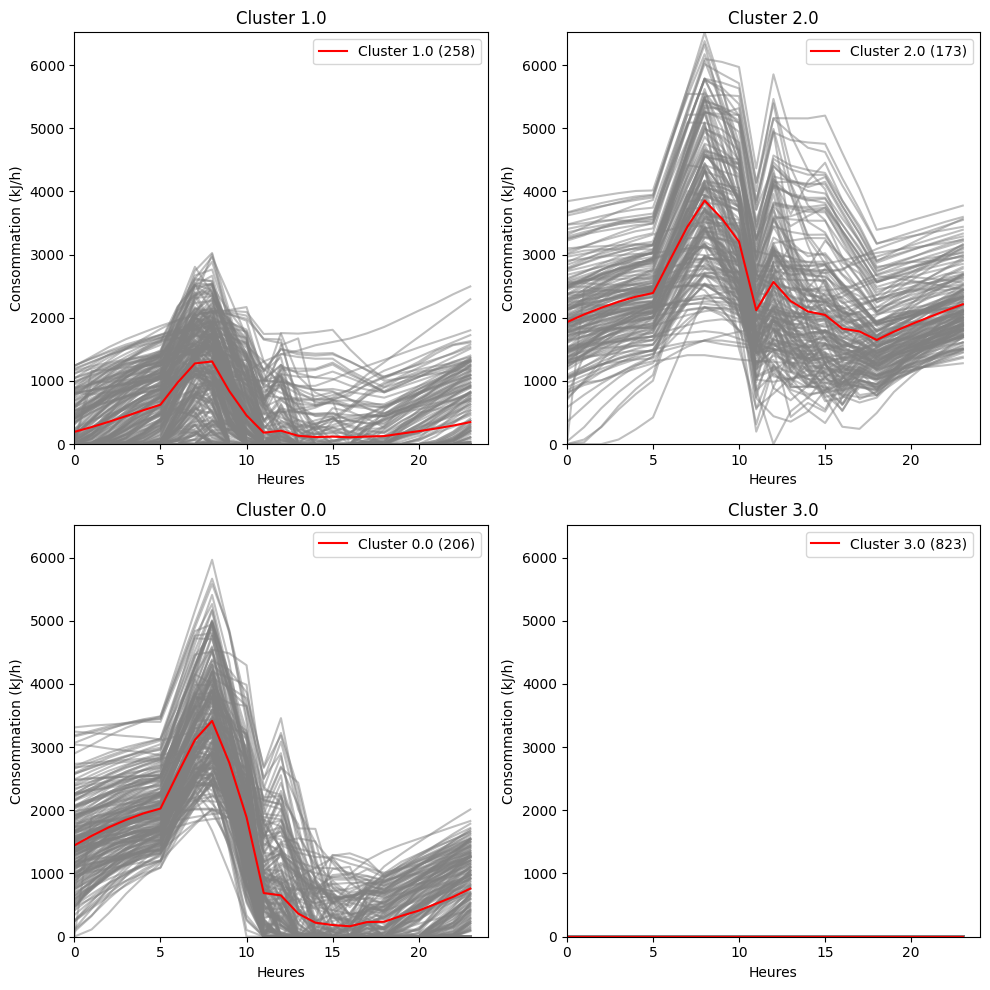

In [29]:
plot_clusters(df_final_tou.drop(columns=["heat_on"]))

In [30]:
evaluate_clustering_cooling(df_final_tou,"heat_on")

Davies-Bouldin Index: 0.9482013561492432
Silhouette Score: 0.6181575798000379


In [31]:
new_parts = {}
n_rows = df_part1.shape[0]
for i in range(1,n_rows):
    new_parts_row = {}  
    old_parts = [df_part1, df_part2, df_part3, df_part4]
    prev_parts = [df_part4, df_part1, df_part2, df_part3]  
    for j in range(4): 
        df_current = old_parts[j] 
        df_prev = prev_parts[j] 
        current_hours = df_current.iloc[i, :-2]  
        if j == 0:  
            prev_hours = df_prev.iloc[i-1, :-2]            
        else:
            prev_hours = df_prev.iloc[i, :-2]        
        combined_hours = pd.concat([prev_hours, current_hours], axis=0).reset_index(drop=True)
        heat_on = df_current.iloc[i, -2]  
        cluster = df_current.iloc[i, -1]   
        new_row = pd.concat([combined_hours, pd.Series([heat_on, cluster], index=['heat_on', 'cluster'])])
        new_parts_row[f'new_part{j+1}'] = new_row
    for key in new_parts_row:
        if key not in new_parts:
            new_parts[key] = []
        new_parts[key].append(new_parts_row[key])
for key in new_parts:
    new_parts[key] = pd.DataFrame(new_parts[key]).reset_index(drop=True)




In [32]:
for i in range(1, 5): 
    new_part_name = f'new_part{i}' 
    file_name = f'consommation_partitionner_48h_{i}.csv' 
    new_parts[new_part_name].to_csv(file_name, index=False)

old_parts = [df_part1, df_part2, df_part3, df_part4]
for i in range(4):  
    file_name = f'consommation_partitionner_24h_{i+1}.csv' 
    old_parts[i].to_csv(file_name, index=False)

In [33]:
old_parts = [df_part1, df_part2, df_part3, df_part4]
for i in range(4):  
    file_name = f'consommation_partitionner_24h_{i+1}.csv' 
    old_parts[i].to_csv(file_name, index=False)